In [ ]:
import pandas as pd
import os
os.environ['CUD4A_LAUNCH_BLOCKING'] = "1"
## Shows error at correct location.
## If we don't use this. Then error is come at another position rather than where mistake is done.
from tqdm import tqdm
import argparse
import glob
import xml.etree.ElementTree as ET
import cv2
import ast
## When we run code, it convert into syntax tree format which helps to analyze, parse the code.
import numpy as np


import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as immg

import random
import sys

import torch

import torchvision
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN

from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"


import warnings
warnings.filterwarnings("ignore")

In [ ]:
# !pip install albumentations==0.4.6
import albumentations as A
from albumentations.pytorch import ToTensorV2

# I. Generate CSV

In [ ]:
path='/kaggle/input/pcb-defects'

In [ ]:
dataset = {
            "xmin":[],
            "ymin":[],
            "xmax":[],
            "ymax":[],
            "class":[],
            "file":[],
            "width":[],
            "height":[],
           }
all_files = []
for path, subdirs, files in os.walk(path):
    for name in files:
        all_files.append(os.path.join(path, name))


In [ ]:
for anno in all_files:
     # Check if the file is an XML file

    if anno.lower().endswith('.xml' or '.JPG' or 'jpg'):
      # lower case the path and then it ends with particular words or not
       tree = ET.parse(anno)
       #XML (Raw Text) → ElementTree (Structured Object in Memory)

       for elem in tree.iter():

          if 'size' in elem.tag:

              for attr in list(elem):
                  if 'width' in attr.tag:
                      width = int(round(float(attr.text)))
                  if 'height' in attr.tag:
                      height = int(round(float(attr.text)))

          if 'object' in elem.tag:

              for attr in list(elem):


                  if 'name' in attr.tag:
                      name = attr.text
                      dataset['class']+=[name]
                      dataset['width']+=[width]
                      dataset['height']+=[height]
                      dataset['file']+=[anno.split('/')[-1][0:-4]]
                              ## example - 04_mouse_bite_02
                  if 'bndbox' in attr.tag:
                      for dim in list(attr):
                          if 'xmin' in dim.tag:
                              xmin = int(round(float(dim.text)))
                              dataset['xmin']+=[xmin]
                          if 'ymin' in dim.tag:
                              ymin = int(round(float(dim.text)))
                              dataset['ymin']+=[ymin]
                          if 'xmax' in dim.tag:
                              xmax = int(round(float(dim.text)))
                              dataset['xmax']+=[xmax]
                          if 'ymax' in dim.tag:
                              ymax = int(round(float(dim.text)))
                              dataset['ymax']+=[ymax]

In [ ]:
data=pd.DataFrame(dataset)
data

,xmin,ymin,xmax,ymax,class,file,width,height
0,1199,966,1234,1004,mouse_bite,01_mouse_bite_11,3034,1586
1,2042,755,2073,786,mouse_bite,01_mouse_bite_11,3034,1586
2,1472,607,1507,639,mouse_bite,01_mouse_bite_11,3034,1586
3,2168,854,2200,887,mouse_bite,01_mouse_bite_17,3034,1586
4,1513,919,1545,957,mouse_bite,01_mouse_bite_17,3034,1586
...,...,...,...,...,...,...,...,...
2948,706,892,741,991,spurious_copper,06_spurious_copper_09,2868,2316
2949,1055,1136,1114,1171,spurious_copper,06_spurious_copper_09,2868,2316
2950,1796,1019,1839,1089,spurious_copper,04_spurious_copper_04,3056,2464
2951,474,1236,527,1382,spurious_copper,04_spurious_copper_04,3056,2464


# II. Reading the CSV file

In [ ]:
df = data.copy()
train, test = train_test_split(data, shuffle=True, test_size=0.2, random_state=34)

In [ ]:
train.shape, test.shape, df.shape

((2362, 8), (591, 8), (2953, 8))

In [ ]:
classes_la = {"missing_hole": 1, "mouse_bite": 2, "open_circuit":3, "short": 4, 'spur': 5,'spurious_copper':6}

df["class"] = df["class"].apply(lambda x: classes_la[x])
train["class"] = train["class"].apply(lambda x: classes_la[x])
test["class"] = test["class"].apply(lambda x: classes_la[x])

In [ ]:
print("Data Frame Size ", len(df))
print("Train Size ", len(train))
print("Test Size ", len(test))

Data Frame Size  2953
Train Size  2362
Test Size  591


# III. Visualization

In [ ]:
def plot_image(image_name):
    print(image_name)
    image_group = data.groupby("file").get_group(image_name)
    bbox = image_group.loc[:,['xmin', 'ymin', 'xmax', 'ymax']]
    path ="/kaggle/input/pcb-defects/PCB_DATASET/images/"
    if "missing" in image_name.split('_'):
        path += 'Missing_hole/'
    if "mouse" in image_name.split('_'):
        path += 'Mouse_bite/'
    if "open" in image_name.split('_'):
        path += 'Open_circuit/'
    if "short" in image_name.split('_'):
        path += 'Short/'
    if "spur" in image_name.split('_'):
        path += 'Spur/'
    if "spurious" in image_name.split('_'):
        path += 'Spurious_copper/'

    img = immg.imread(path+""+name+'.jpg')
    fig,ax = plt.subplots(figsize=(18,10))
    ax.imshow(img,cmap='binary')
    for i in range(len(bbox)):
        box = bbox.iloc[i].values
        print(box)
        x,y,w,h = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = matplotlib.patches.Rectangle((x,y),w,h,linewidth=1,edgecolor='r',facecolor='none',)
        # ax.text(*box[:2], image_group["class"].values, verticalalignment='top', color='white', fontsize=13, weight='bold')
        ax.add_patch(rect)
    plt.show()

08_mouse_bite_08
[1258 1302 1305 1361]
[617 900 668 966]
[2274 1206 2333 1264]
[2555 1343 2610 1421]
[1520  592 1586  638]


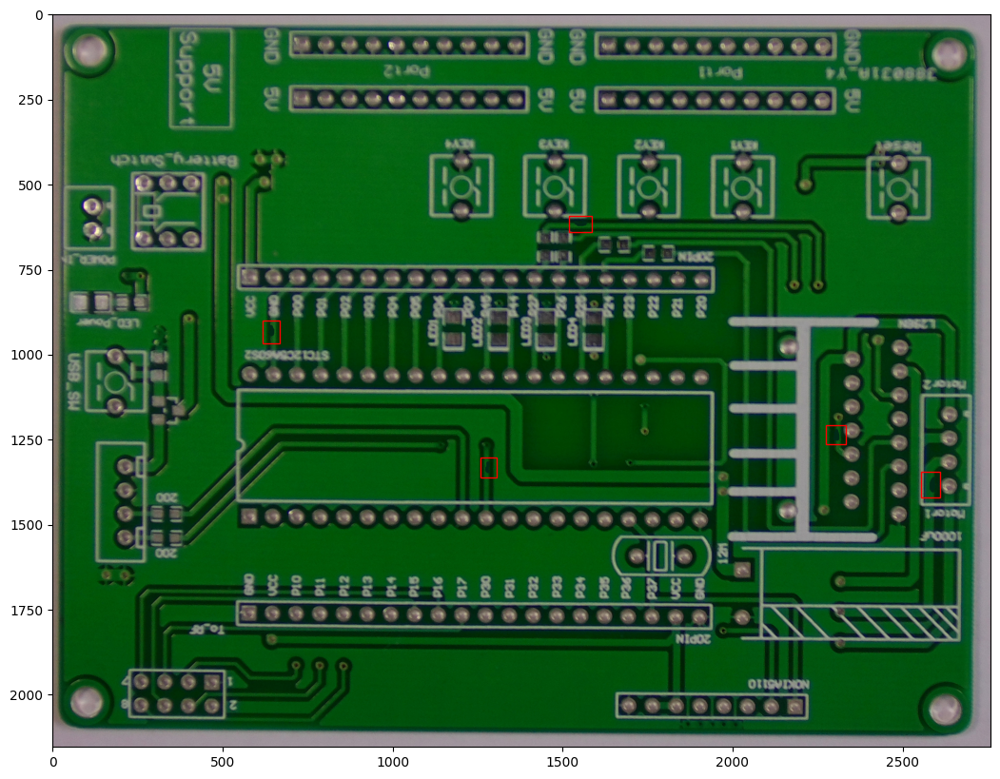

In [ ]:
name = df.file[6]
plot_image(name)

In [ ]:
image_group = df.groupby("file").get_group('08_mouse_bite_08')
image_group

,xmin,ymin,xmax,ymax,class,file,width,height
6,1258,1302,1305,1361,2,08_mouse_bite_08,2759,2154
7,617,900,668,966,2,08_mouse_bite_08,2759,2154
8,2274,1206,2333,1264,2,08_mouse_bite_08,2759,2154
9,2555,1343,2610,1421,2,08_mouse_bite_08,2759,2154
10,1520,592,1586,638,2,08_mouse_bite_08,2759,2154


# IV. Creating Custom database

In [ ]:
class pcbData(object):
    def __init__(self, df, IMG_DIR, transforms):
        self.df = df ## image dataframe
        self.img_dir = IMG_DIR ## contain image path
        self.image_ids = self.df['file'].unique().tolist() ## [.unique] convert image_ids like "01_missing_hole_06" into a array form
                                                       ##  array converts into list
        self.transforms = transforms ## apply transformation or not

    def __len__(self):
        return len(self.image_ids) ## calculate the length of the list of image ids

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        a = ''
        if "missing" in image_id.split('_'):
            a = 'Missing_hole/'
        elif "mouse" in image_id.split('_'):
            a = 'Mouse_bite/'
        elif "open" in image_id.split('_'):
            a = 'Open_circuit/'
        elif "short" in image_id.split('_'):
            a = 'Short/'
        elif "spur" in image_id.split('_'):
            a = 'Spur/'
        elif "spurious" in image_id.split('_'):
            a = 'Spurious_copper/'

        image_values = self.df[self.df['file'] == image_id] ## contain dataset that contain images
        image = cv2.imread(self.img_dir + a + image_id + ".jpg", cv2.IMREAD_COLOR) ## read the image data path and take all color using IMREAD_COLOR
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) ## convert the image into RGB form from BRG form
        image = image/ 255.0  ## normalize the image

        boxes = image_values[['xmin', 'ymin', 'xmax', 'ymax']].to_numpy() ## contain the orrdinates of the boxes in numpy array
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) ## compute box to calculate IOU

        labels = image_values["class"].values.tolist()   ## contain the type of defect that pcb have
        labels = torch.tensor(labels, dtype=torch.int64)  # Ensure it's a tensor

        target = {
            'boxes': torch.tensor(boxes, dtype=torch.float32),  # Convert boxes to tensor
            'labels': labels,
            'image_id': torch.tensor([idx]),
            'area': torch.as_tensor(area, dtype=torch.float32),
            'iscrowd': torch.zeros(len(labels), dtype=torch.int64)
        }

        if self.transforms:
            sample = {
                'image': image,
                'bboxes': boxes.tolist(),  # Convert to list
                'labels': labels.tolist()  # Ensure labels are a list
            }

            sample = self.transforms(**sample) ## apply self.transform
                                      ## the double asterisk signify that we unpack key-value pairs
            image = sample['image']
            #Convert list of bounding boxes to a PyTorch tensor
            target['boxes'] = torch.tensor(sample['bboxes'], dtype=torch.float32)  # Convert back to tensor
            # Store in target dictionary
        return torch.tensor(image), target, image_id


Define the image transformations. We'll use albumentations package: https://albumentations.ai/


In [ ]:
def get_train_transform():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
        ## bbox_parameters ensures that transformations is applied to both image and its bounding boxes
        ## pascal_voc ensures that the bbox is in this format(xmin, ymin, xmax, ymax)
        ## when we use label_fields it means that in which variable labels are present
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
def get_test_transform():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

In [ ]:
path ="/kaggle/input/pcb-defects/PCB_DATASET/images/"
pcb_dataset   = pcbData(df, path, get_train_transform())

In [ ]:
len(pcb_dataset)

693

In [ ]:
image_ids = df['file'].unique().tolist()
indes = image_ids.index('08_mouse_bite_08')

In [ ]:
indes

2

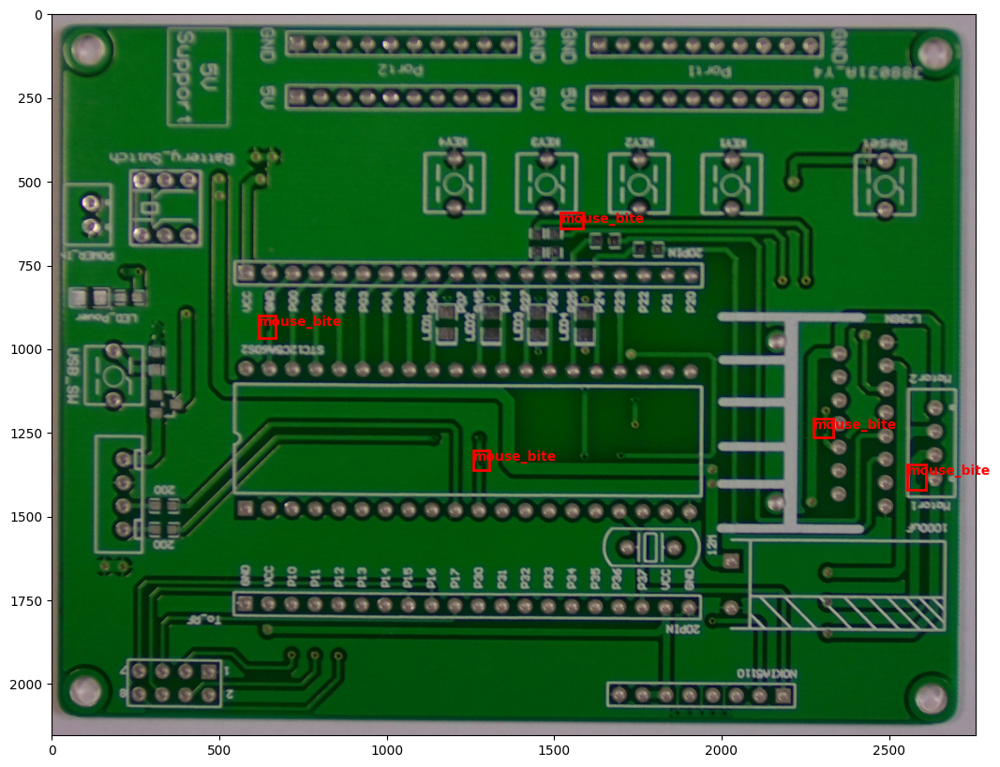

In [ ]:
img, tar, _ = pcb_dataset[indes]
bbox = tar['boxes']
fig,ax = plt.subplots(figsize=(18,10))
ax.imshow(img.permute(1,2,0).cpu().numpy())
for j in tar["labels"].tolist():
    classes_la = {1:"missing_hole", 2: "mouse_bite", 3:"open_circuit",4: "short", 5:'spur',6:'spurious_copper'}
    l = classes_la[j]
    for i in range(len(bbox)):
        box = bbox[i]
        x,y,w,h = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = matplotlib.patches.Rectangle((x,y),w,h,linewidth=2,edgecolor='r',facecolor='none',)
        ax.text(*box[:2], l, verticalalignment='top', color='red', fontsize=10, weight='bold')
        ax.add_patch(rect)
    plt.show()

In [ ]:
image_ids=df['file'].unique()
print(len(image_ids))

693


Split data into training and test

In [ ]:
valid_df = train.sample(frac=0.1, random_state=42)
indices_to_remove = valid_df.index
train_df = train.drop(indices_to_remove)
test_df = test
train_df.shape,valid_df.shape

((2126, 8), (236, 8))

# V. Dataloader

In [ ]:
path

'/kaggle/input/pcb-defects/PCB_DATASET/images/'

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
train_dataset = pcbData(train_df, path, get_train_transform())
valid_dataset = pcbData(valid_df, path, get_valid_transform())
test_dataset  = pcbData(test_df , path, get_test_transform() )

# split the dataset in train and test set
indices = torch.randperm(len(train_dataset)).tolist()

train_data_loader = DataLoader(
    train_dataset,
    batch_size=1,
    shuffle=True,
    num_workers=6,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=1,
    shuffle=True,
    num_workers=6,
    collate_fn=collate_fn
)

test_data_loader = DataLoader(
    test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=6,
    collate_fn=collate_fn
)

In [ ]:
print(len(train_data_loader),len(valid_data_loader),len(test_data_loader))

687 210 410


Most pretrained models are trained with a background class, we'll include it in our model, so in that case our number of classes will be 6

In [ ]:
def load_model():
    num_classes = 6+1 ## classes + background
  ## Resnet not account for background class
  ## But fastercnn_resnet50_fpn does
  ## we are loading a model which is pre trained on COCO dataset

    # load a model; pre-trained on COCO
    # .. fpn = 'feature pyramid network'
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)


    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print("Using device ",device)

Using device  cuda


In [ ]:
model=load_model()
for name, params in model.named_parameters():
    if params.requires_grad and name.__contains__("predict"):
        print(name)

roi_heads.box_predictor.cls_score.weight
roi_heads.box_predictor.cls_score.bias
roi_heads.box_predictor.bbox_pred.weight
roi_heads.box_predictor.bbox_pred.bias


In [ ]:
def load_params():
    model=load_model().to(device)
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.Adam(params, lr=0.0001, weight_decay=0.0005,)
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
    return model,params,optimizer,lr_scheduler

# VI. Training and evaluation

In [ ]:
train_data_loader

In [ ]:
def orthogonal_loss(lembda):
    extra_norm=0.
    for m in model.modules():
        if isinstance(m,torch.nn.Linear) or isinstance(m,torch.nn.Conv2d):
            tmp=m.weight.view(m.weight.data.size(0), -1)
            s1,s2=tmp.shape  # For unequal matrices semi orthogonal condition is imposed
            if s1<s2:
                extra_norm+=torch.norm(torch.mm(tmp,tmp.t())-torch.eye(s1).to(device),p='fro')
            else:
                extra_norm+=torch.norm(torch.mm(tmp.t(),tmp)-torch.eye(s2).to(device),p='fro')
    return lembda*extra_norm

In [ ]:
lembdas = [0.,0.0001,0.001,0.01]
loss_curves = []
IOU_curves = []
models  = []

for lembda in lembdas:

    min_loss = sys.maxsize
    num_epochs = 25

    model=load_model().to(device)
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.Adam(params, lr=0.0001, weight_decay=0.0005,)
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

    loss_curve=[]
    IOU_curve=[]

    for epoch in range(num_epochs):
        tk = tqdm(train_data_loader)
        model.train()
        running_loss = 0.
        for images, targets, image_ids in tk:
            # Shifting everything to CUDA (NO CHANGE IN DATA)
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)

            losses = sum(loss for loss in loss_dict.values())
            loss_value = losses + orthogonal_loss(lembda)
            running_loss+=loss_value.item()

            optimizer.zero_grad()
            loss_value.backward()
            optimizer.step()

            loss_curve.append(loss_value.item())
            tk.set_postfix(train_loss=loss_value.item())
        tk.close()
        running_loss/=len(train_data_loader)
        loss_curve.append(running_loss)

        # update the learning rate
        if lr_scheduler is not None:
            lr_scheduler.step()

        print(f"Epoch #{epoch} loss: {loss_value.item()}")

        #validation
        model.eval();
        with torch.no_grad():
            tk = tqdm(valid_data_loader)
            running_IOU=0.
            for images, targets, image_ids in tk:
                # Shifting everthing to CUDA (NO CHANGE IN DATA)
                images = list(image.to(device) for image in images)
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
                val_output = model(images)
                val_output = [{k: v.to(device) for k, v in t.items()} for t in val_output]
                IOU = []
                for j in range(len(val_output)):
                    a,b = val_output[j]['boxes'].cpu().detach(), targets[j]['boxes'].cpu().detach()
                    chk = torchvision.ops.box_iou(a,b)
                    res = np.nanmean(chk.sum(axis=1)/(chk>0).sum(axis=1))
                    if np.isnan(res):
                        res = 0.0
                    IOU.append(res)
                running_IOU += np.nanmean(IOU)
                tk.set_postfix(IoU=np.nanmean(IOU))
            running_IOU/=len(valid_data_loader)
            IOU_curve.append(running_IOU)
            tk.close()
        print("IOU Average Measure ",IOU_curve[-1])
    IOU_curves.append(IOU_curve)
    loss_curves.append(loss_curve)
    models.append(model)

  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #0 loss: 0.33417537808418274


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.4720150142198517


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #1 loss: 0.40632104873657227


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.591524636674495


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #2 loss: 0.1975189745426178


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.6162282922793002


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #3 loss: 0.2817056179046631


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.6801871955394745


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #4 loss: 0.07779751718044281


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.6936515944344657


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #5 loss: 0.1999933123588562


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.6994486356065387


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #6 loss: 0.10625381767749786


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7028735481557392


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #7 loss: 0.2804599702358246


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7036652970881689


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #8 loss: 0.1130724847316742


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7088337781883421


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #9 loss: 0.1881631761789322


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7089690847056253


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #10 loss: 0.20137034356594086


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7060470772641045


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #11 loss: 0.11777722835540771


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7062293712581907


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #12 loss: 0.11254628747701645


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7062305231889089


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #13 loss: 0.17741802334785461


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7062338576430366


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #14 loss: 0.12534251809120178


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061375152497065


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #15 loss: 0.14226789772510529


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061373699279059


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #16 loss: 0.1484786719083786


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061372949963525


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #17 loss: 0.21924956142902374


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.706137544910113


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #18 loss: 0.15782517194747925


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061375762735095


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #19 loss: 0.13000474870204926


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061374641600109


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #20 loss: 0.19750188291072845


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061374796288354


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #21 loss: 0.08956673741340637


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061374581995464


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #22 loss: 0.22678202390670776


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061374448594593


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #23 loss: 0.11077594757080078


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061374476977758


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #24 loss: 0.2964431047439575


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7061374559288933


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #0 loss: 0.31278735399246216


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.5036340988817669


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #1 loss: 0.3510327935218811


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.5643057051513877


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #2 loss: 0.2517094016075134


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.5974311336165383


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #3 loss: 0.2636619210243225


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.6928600592272622


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #4 loss: 0.3319705128669739


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7123595864999862


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #5 loss: 0.22787870466709137


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7142506254570825


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #6 loss: 0.20372545719146729


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7088983349856877


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #7 loss: 0.32255011796951294


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7121684277341479


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #8 loss: 0.2983959913253784


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7089244875169936


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #9 loss: 0.21781200170516968


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7088372433469409


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #10 loss: 0.2475079596042633


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7085232551608767


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #11 loss: 0.3051930069923401


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7085620418900536


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #12 loss: 0.17520636320114136


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7084545047510238


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #13 loss: 0.19793303310871124


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7084534893433253


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #14 loss: 0.4231727421283722


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7087105028686069


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #15 loss: 0.18954306840896606


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7087102498326983


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #16 loss: 0.19185468554496765


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.708710494921321


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #17 loss: 0.23827505111694336


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7087103890521186


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #18 loss: 0.2775794267654419


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.708710440993309


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #19 loss: 0.20371663570404053


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7087104248149054


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #20 loss: 0.22767436504364014


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7087103542827424


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #21 loss: 0.24629029631614685


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7087103877748762


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #22 loss: 0.2795860469341278


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7087103732994624


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #23 loss: 0.25891682505607605


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7087103679066613


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #24 loss: 0.27588388323783875


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7087103732994624


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #0 loss: 1.3456623554229736


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.5015505047071548


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #1 loss: 1.2116410732269287


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.5357677266001701


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #2 loss: 1.3787823915481567


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.601054155542737


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #3 loss: 1.1940042972564697


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.6890785360620135


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #4 loss: 1.2195186614990234


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7012907892465592


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #5 loss: 1.071761131286621


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.6972668806711833


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #6 loss: 1.1605558395385742


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7091096365735644


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #7 loss: 1.069879174232483


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7102224713280088


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #8 loss: 1.0334577560424805


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.711818696913265


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #9 loss: 1.1084315776824951


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7118014490320569


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #10 loss: 1.1768782138824463


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7120298744667144


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #11 loss: 1.0520782470703125


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7084550907214483


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #12 loss: 1.0906224250793457


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.708270357194401


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #13 loss: 0.9794653654098511


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.708327197602817


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #14 loss: 1.167344093322754


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083304138410659


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #15 loss: 1.1192755699157715


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083306342363358


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #16 loss: 1.1887996196746826


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083310198216212


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #17 loss: 1.1025370359420776


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083309749762218


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #18 loss: 1.0770784616470337


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083309464511417


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #19 loss: 1.078906536102295


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.708330970009168


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #20 loss: 1.1396604776382446


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083310274850755


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #21 loss: 1.0668436288833618


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083310010887328


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #22 loss: 1.1612522602081299


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083309758277166


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #23 loss: 1.0751396417617798


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083310036432175


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #24 loss: 1.0753496885299683


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7083309857618241


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #0 loss: 7.799360752105713


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.4568596927892594


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #1 loss: 6.159064769744873


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.5340520206306661


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #2 loss: 5.245591163635254


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.5092212978573073


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #3 loss: 4.9103240966796875


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.681392679469926


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #4 loss: 4.9845805168151855


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.6993648371526173


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #5 loss: 4.74893045425415


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7074344890458243


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #6 loss: 4.737905502319336


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7020016482898167


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #7 loss: 4.76347541809082


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7044300198554992


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #8 loss: 4.752718448638916


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7029954864865258


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #9 loss: 4.73225212097168


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7037406252963202


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #10 loss: 4.673446178436279


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042901389655613


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #11 loss: 4.763225078582764


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042664957898004


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #12 loss: 4.75274658203125


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7041720665636517


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #13 loss: 4.741641521453857


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042974838188716


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #14 loss: 4.754712104797363


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042970384870256


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #15 loss: 4.702164649963379


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042969570273445


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #16 loss: 4.619254112243652


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042967887151809


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #17 loss: 4.608343124389648


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042964818931762


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #18 loss: 4.634026527404785


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042964881374723


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #19 loss: 4.663346767425537


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042964665662674


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #20 loss: 4.648229122161865


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.704296426546006


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #21 loss: 4.73436164855957


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042964289585749


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #22 loss: 4.674498081207275


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042964149089087


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #23 loss: 4.690202236175537


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042964502459481


  0%|          | 0/687 [00:00<?, ?it/s]

Epoch #24 loss: 4.656368732452393


  0%|          | 0/210 [00:00<?, ?it/s]

IOU Average Measure  0.7042964556387492


In [ ]:
model_2 = model

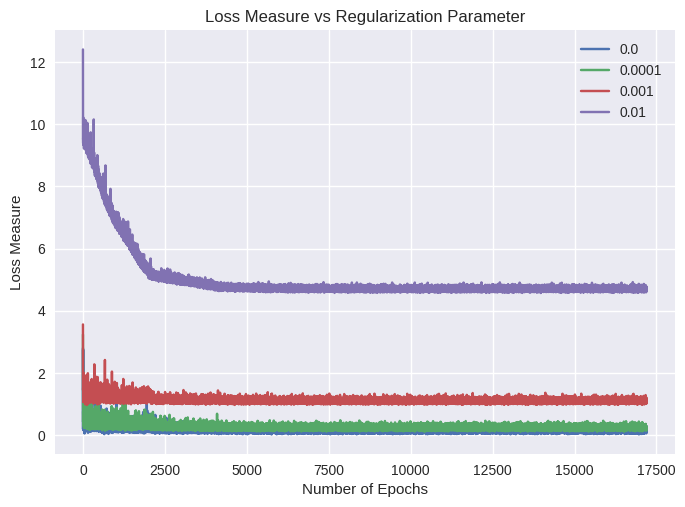

In [ ]:
plt.style.use('seaborn')
for lc,l in zip(loss_curves,lembdas):
    plt.plot(lc,label=l)
plt.legend()
plt.xlabel("Number of Epochs")
plt.ylabel("Loss Measure")
plt.title("Loss Measure vs Regularization Parameter")
plt.savefig('loss_curves.png')
plt.show()

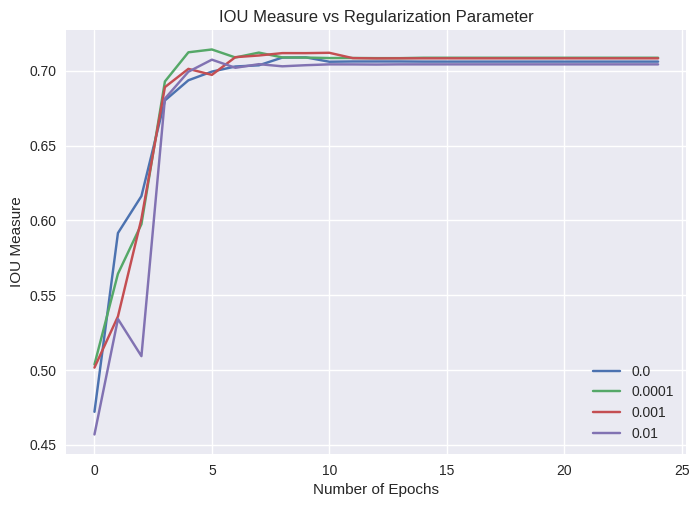

In [ ]:
for ic,l in zip(IOU_curves,lembdas):
    plt.plot(ic,label=l)
plt.legend()
plt.xlabel("Number of Epochs")
plt.ylabel("IOU Measure")
plt.title("IOU Measure vs Regularization Parameter")
plt.savefig('iou_curves.png')
plt.show()

##### Sample evaluation on validation dataset image

In [ ]:
img,target,_ = valid_dataset[0]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]

print('predicted #boxes: ', len(prediction['boxes']))
print('real #boxes: ', len(target['boxes']))

predicted #boxes:  5
real #boxes:  1


In [ ]:
for i, model in enumerate(models):
    model_path = f'model_{i}.pth'
    torch.save(model, model_path)
    print(f"Model {i} saved at {model_path}")


Model 0 saved at model_0.pth
Model 1 saved at model_1.pth
Model 2 saved at model_2.pth
Model 3 saved at model_3.pth


In [ ]:
models_load = []

In [ ]:
model_0 = torch.load('/kaggle/input/model-0-0/model_0.0 (1).pth')
model_01 = torch.load('/kaggle/input/model-0-01/model_0.01.pth')
model_02 = torch.load('/kaggle/input/model-0-001/model_0.001 (1).pth')
model_03 = torch.load('/kaggle/input/model-0-0001/model_0.0001 (1).pth')

In [ ]:
models_load.append(model_0)
models_load.append(model_01)
models_load.append(model_02)
models_load.append(model_03)

# VII. Evaluation

In [ ]:
y_true = []
y_pred = []
# Model ko eval mode me dalo
model = models_load[3]
model.eval()
# Pehle model ka device check karo
device = next(model.parameters()).device  # Model GPU pe hai ya CPU pe, yeh pata karega
for data in valid_dataset:
    img, target, _ = data
    # Fix: Input ko model ke device pe bhejo
    img = img.to(device)
    with torch.no_grad():
        y_true.append(target['labels'][0].to(device))  # Labels bhi same device pe dalo
        prediction = model([img])[0]  # Model GPU pe hai, toh input bhi GPU pe hai
        if len(prediction['labels']) == 0:
            y_pred.append(torch.tensor(0, device=device))  # Ensure this tensor is on the same device
        else:
            y_pred.append(prediction['labels'][0])  # Already on the correct device

In [ ]:
yy_pred = []
for v in y_pred:
    yy_pred.append(v)

In [ ]:
from sklearn.metrics import confusion_matrix
import torch
# ✅ Fix: GPU tensors ko CPU + NumPy me convert karo
y_true_cpu = torch.tensor(y_true).cpu().numpy()
y_pred_cpu = torch.tensor(y_pred).cpu().numpy()
# ✅ Ab sklearn error nahi dega
cm = confusion_matrix(y_true_cpu, y_pred_cpu)
print(cm)


[[55  0  0  0  0  0]
 [ 0 65  0  0  0  0]
 [ 0  0 54  0  0  0]
 [ 0  0  0 62  0  0]
 [ 0  0  0  0 52  0]
 [ 0  0  0  0  0 58]]


In [ ]:
from sklearn.metrics import classification_report
import torch

# ✅ Fix: Convert tensors from GPU to CPU and then to NumPy
y_true_cpu = torch.tensor(y_true).cpu().numpy()
y_pred_cpu = torch.tensor(yy_pred).cpu().numpy()

# ✅ Ab sklearn error nahi dega
print(classification_report(y_true_cpu, y_pred_cpu))


              precision    recall  f1-score   support

           1       1.00      1.00      1.00        55
           2       1.00      1.00      1.00        65
           3       1.00      1.00      1.00        54
           4       1.00      1.00      1.00        62
           5       1.00      1.00      1.00        52
           6       1.00      1.00      1.00        58

    accuracy                           1.00       346
   macro avg       1.00      1.00      1.00       346
weighted avg       1.00      1.00      1.00       346



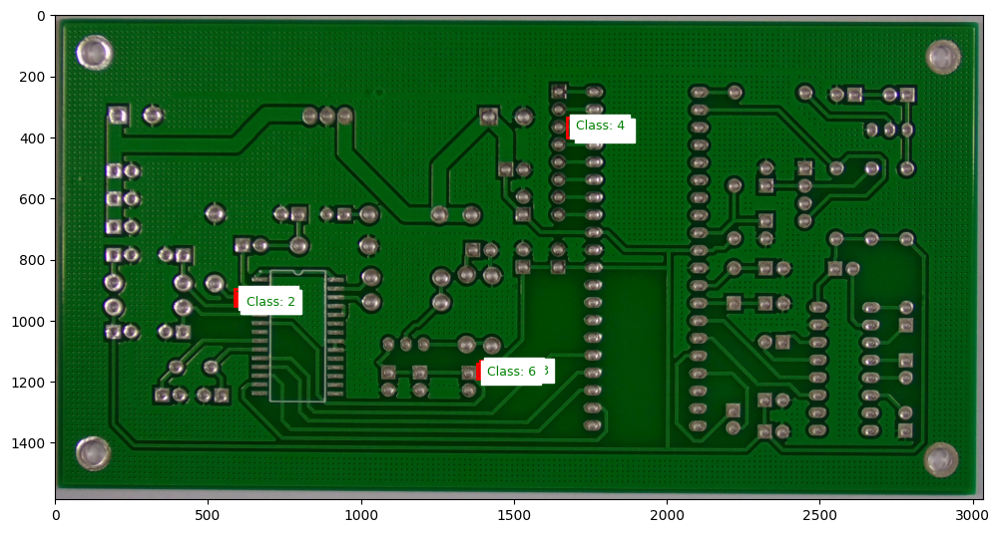

In [ ]:
import torch
import torchvision.transforms as T
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

#  Model GPU pe hai toh ensure karo
model = torch.load('/kaggle/input/model-0-0001/model_0.0001 (1).pth')
model = model.to('cuda')  # ✅ Move model to GPU
model.eval()

#  Load image
image_path = '/kaggle/input/pcb-defects/PCB_DATASET/images/Open_circuit/01_open_circuit_03.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = image / 255.0  # Normalize

#  Apply transformation
transform = T.Compose([T.ToTensor()])
image = transform(image).float()

#  Move image to GPU
image = image.to('cuda')

#  Prediction
with torch.no_grad():
    outputs = model([image])

#  Fix: Move tensors to CPU before converting to NumPy
boxes = outputs[0]['boxes'].detach().cpu().numpy()
labels = outputs[0]['labels'].detach().cpu().numpy()

#  Visualization
fig, ax = plt.subplots(figsize=(12, 8))
ax.imshow(image.permute(1, 2, 0).cpu().numpy())  # Move image to CPU before plotting

for box, label in zip(boxes, labels):
    x1, y1, x2, y2 = box
    w, h = x2 - x1, y2 - y1
    rect = patches.Rectangle((x1, y1), w, h, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    ax.text(x1+30, y1+40, f"Class: {label}", fontsize=9, color='g', backgroundcolor='w')

plt.show()


# VIII. Testing Results

In [ ]:
import cv2
import torch
import matplotlib.pyplot as plt
import torchvision.transforms as T
import matplotlib.patches as patches

def check(model):
    defect_names = {
        1: "Missing Hole",
        2: "Mouse Bite",
        3: "Open circuit",
        4: "Short Circuit",
        5: "Spur",
        6: "Spurious Copper",
    }

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)  # Move model to GPU if available
    model.eval()

    # Load the image
    image_path = '/kaggle/input/pcb-defects/PCB_DATASET/images/Mouse_bite/08_mouse_bite_08.jpg'
    image = cv2.imread(image_path)

    # Check if image is loaded
    if image is None:
        raise FileNotFoundError(f"Error: Could not load image at {image_path}. Check file path and format.")

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image.astype('float32') / 255.0  # Ensure float32

    # Define the transformation to apply to the image
    transform = T.Compose([T.ToTensor()])
    image = transform(image).unsqueeze(0).to(device).float()  # Convert to float32

    # Predict the bounding boxes and labels for the image
    with torch.no_grad():
        outputs = model(image)

    outputs = outputs[0]  # Extract first result
    boxes = outputs['boxes'].detach().cpu().numpy()
    labels = outputs['labels'].detach().cpu().numpy()

    # Visualize the image and the predicted bounding boxes
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(image.squeeze(0).permute(1, 2, 0).cpu().numpy())

    for box, label in zip(boxes, labels):
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        rect = patches.Rectangle((x1, y1), w, h, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(x1-50, y2 + 70, defect_names.get(label, "Unknown"), fontsize=12, color='g', backgroundcolor='w')

    plt.show()


# PREDICTED BOX

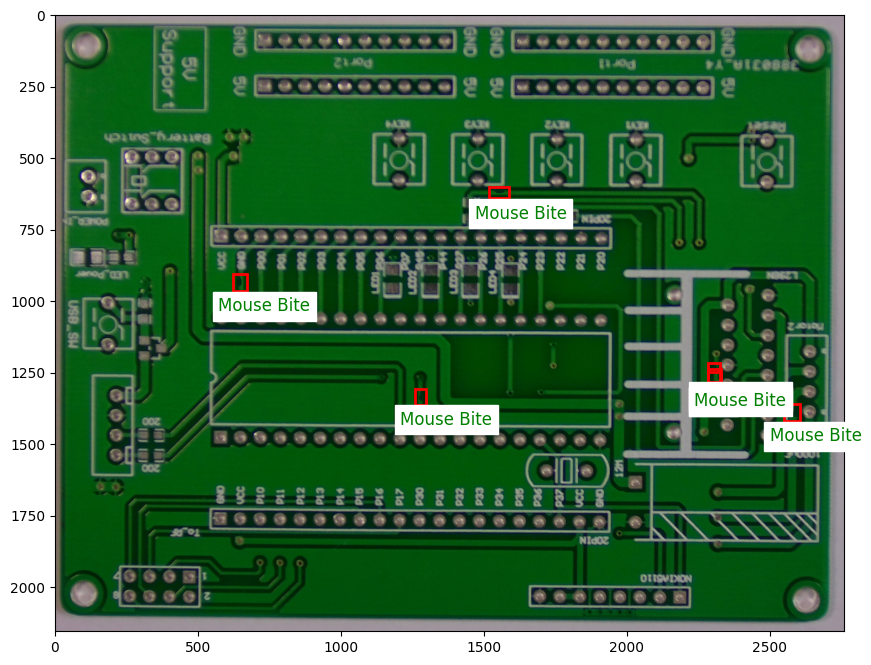

In [ ]:
model = torch.load('/kaggle/input/model-0-0/model_0.0 (1).pth')
model = model.to('cuda')  # ✅ Move model to GPU
model.eval()
check(model)

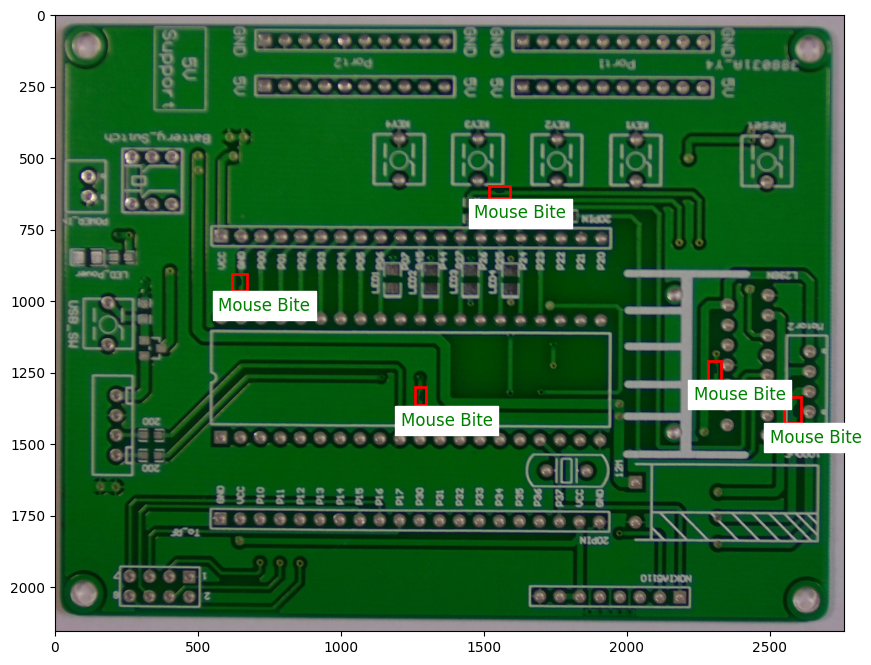

In [ ]:
model = torch.load('/kaggle/input/model-0-0001/model_0.0001 (1).pth')
model = model.to('cuda')  # ✅ Move model to GPU
model.eval()
check(model)

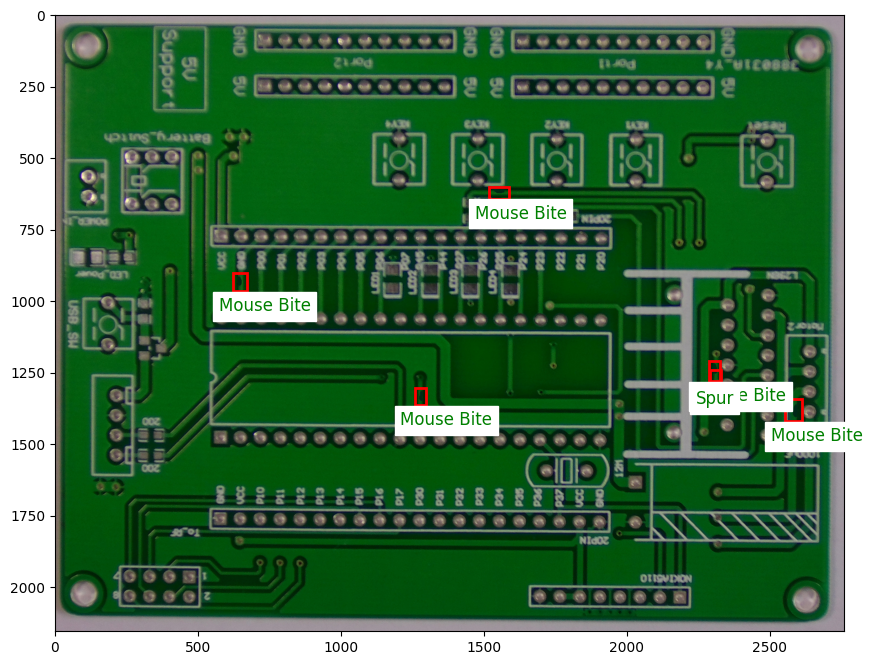

In [ ]:
model = torch.load('/kaggle/input/model-0-001/model_0.001 (1).pth')
model = model.to('cuda')  # ✅ Move model to GPU
model.eval()
check(model)

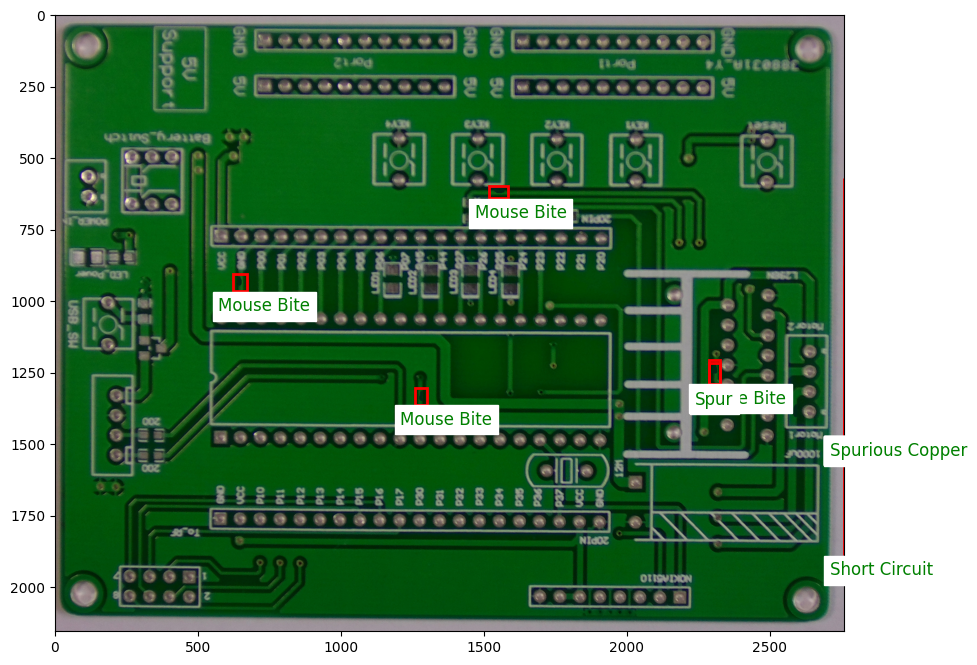

In [ ]:
model = torch.load('/kaggle/input/model-0-01/model_0.01.pth')
model = model.to('cuda')  # ✅ Move model to GPU
model.eval()
check(model)

# GROUND TRUTH BBOX

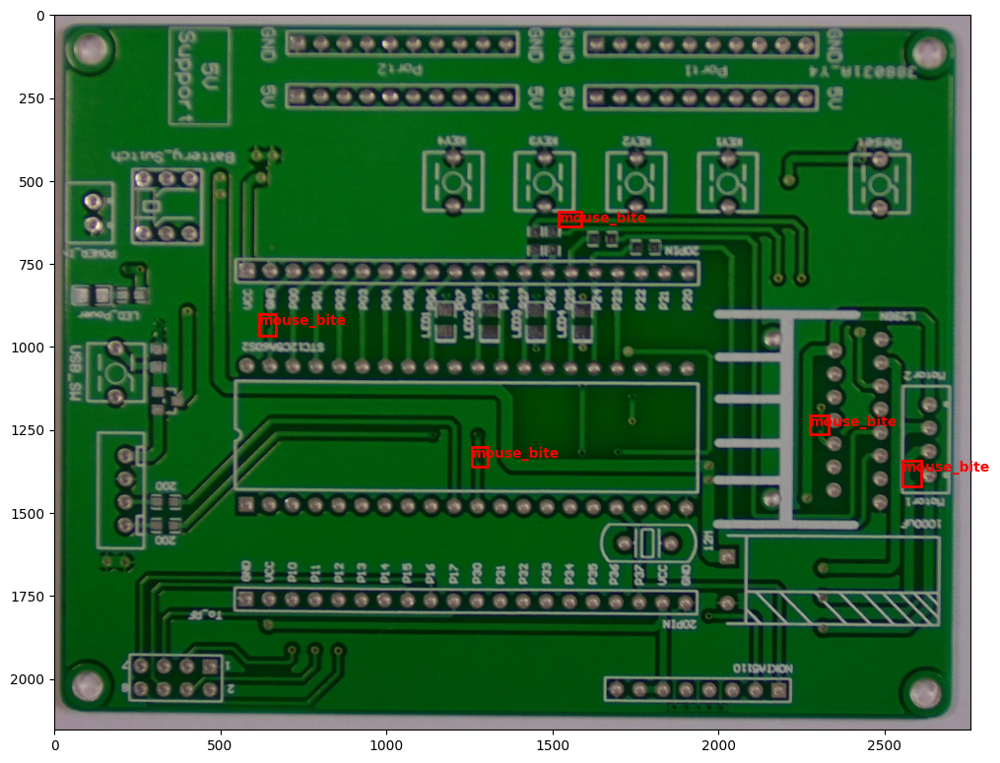

In [ ]:
img, tar, _ = pcb_dataset[indes]
bbox = tar['boxes']
fig,ax = plt.subplots(figsize=(12,10))
ax.imshow(img.permute(1,2,0).cpu().numpy())
for j in tar["labels"].tolist():
    classes_la = {1:"missing_hole", 2: "mouse_bite", 3:"open_circuit",4: "short", 5:'spur',6:'spurious_copper'}
    l = classes_la[j]
    for i in range(len(bbox)):
        box = bbox[i]
        x,y,w,h = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = matplotlib.patches.Rectangle((x,y),w,h,linewidth=2,edgecolor='r',facecolor='none',)
        ax.text(*box[:2], l, verticalalignment='top', color='red', fontsize=10, weight='bold')
        ax.add_patch(rect)
    plt.show()